#RESULTS NOTEBOOK

## Load the dataset

In [1]:
!unzip dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: val/dataset/extra_train_00000039_30.jpg  
  inflating: val/dataset/extra_train_00002114.jpg  
  inflating: val/dataset/extra_train_00001989_1.jpg  
  inflating: val/dataset/extra_train_00000079_61.jpg  
  inflating: val/dataset/extra_train_00001276_9.jpg  
  inflating: val/dataset/extra_train_00000866_32.jpg  
  inflating: val/dataset/extra_train_00001461_18.jpg  
  inflating: val/dataset/extra_train_00001276_13.jpg  
  inflating: val/dataset/extra_train_00001376_8.jpg  
  inflating: val/dataset/extra_train_00001103_28.jpg  
  inflating: val/dataset/extra_train_00001503_2.jpg  
  inflating: val/dataset/extra_train_00001470_15.jpg  
  inflating: val/dataset/extra_train_00001613_17.jpg  
  inflating: val/dataset/extra_train_00001547_15.jpg  
  inflating: val/dataset/extra_train_00000195_38.jpg  
  inflating: val/dataset/extra_train_00001559_23.jpg  
  inflating: val/dataset/extra_test_00000012_12.jpg  
  inflating: val/datas

#Import relevant libraries

In [2]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras import applications
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Conv2D, Activation,Reshape, UpSampling2D,Conv2DTranspose
from tensorflow.keras.layers import Layer
from tensorflow.keras import layers
from skimage.io import imshow
from skimage.color import rgb2lab, lab2rgb, rgb2gray
from IPython import display
from tensorflow.keras import backend as K
from tqdm import tqdm
from matplotlib.pyplot import figure

from tensorflow import keras
import skimage
from skimage import io



IMG_WIDTH = 256
IMG_HEIGHT = 256
BUFFER_SIZE = 400
BATCH_SIZE = 8

#Required helper functions

In [3]:
#For generator
def load(image):
  coloured = image
  grayscale = tf.image.rgb_to_grayscale(image)
  grayscale = tf.concat([grayscale,grayscale,grayscale],-1)
  # Convert both images to float32 tensors
  grayscale = tf.cast(grayscale, tf.float32)
  coloured = tf.cast(coloured, tf.float32)
  return grayscale, coloured  


def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image  

# Normalizing the images to [0, 1]
def normalize(input_image, real_image):
  input_image = input_image/256
  real_image = real_image/256

  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image


def deprocess(imgs):
    imgs = imgs * 255
    imgs = np.array(imgs)
    imgs[imgs>255] = 255
    imgs[imgs < 0] = 0
    return imgs.astype(np.uint8)
    



def read_img(img):
    res = []
    for i,image in enumerate(img.numpy()):
      labimg = cv2.cvtColor(cv2.resize(image, (224, 224)), cv2.COLOR_BGR2Lab)
      labimg = labimg[:,:,0]
      labimg = labimg.reshape(labimg.shape+(1,))
      res.append(labimg)
    res = np.array(res)
    return res

def reconstruct(batchX, predictedY):
    result = np.concatenate((batchX, predictedY), axis=-1)
    res = []
    for i,image in enumerate(result):
      rgbimg = cv2.cvtColor(image, cv2.COLOR_Lab2RGB)
      res.append(rgbimg)
    res = np.array(res)
    return res


def colouriseTest():
  from matplotlib.pyplot import figure
  for example_input, example_target in test_dataset.take(1):
    f, axarr = plt.subplots(BATCH_SIZE,6,gridspec_kw={'wspace':0.2,'hspace':0,
                                    'top':0.6, 'bottom':0, 'left':0., 'right':0.5},figsize=(30,30))  
    f.tight_layout()

    L = rgb2lab(example_input)[:,:,:,0]/100
    L = L.reshape(L.shape+(1,))
    L2 = read_img(example_input)/100


    pred1 = model1(L)
    pred2 = model2(L)
    pred3, _  = model4(np.tile(L2,[1,1,1,3]))
    pred3 = tf.image.resize(pred3, [256, 256],
                        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    result1 = lab2rgb(tf.concat([L*100,pred1*128],axis=-1))
    result2 = lab2rgb(tf.concat([L*100,pred2*128],axis=-1))
    result3 = model3(example_input)
    result4 = reconstruct(deprocess(L), deprocess(pred3))

    if(BATCH_SIZE==1):
      axarr[0].title.set_text("Gray")
      axarr[1].title.set_text("Ground Truth")
      axarr[2].title.set_text("Simple AutoEncoder")
      axarr[3].title.set_text("Global AutoEncoder")
      axarr[4].title.set_text("Pix2Pix")
      axarr[5].title.set_text("ChromaGAN")

      axarr[0].axis('off')
      axarr[1].axis('off')
      axarr[2].axis('off')
      axarr[3].axis('off')
      axarr[4].axis('off')
      axarr[5].axis('off')

      axarr[0].imshow(example_input[0],cmap="gray")
      axarr[1].imshow(example_target[0])
      axarr[2].imshow(result1[0])
      axarr[3].imshow(result2[0])
      axarr[4].imshow(result3[0])
      axarr[5].imshow(result4[0])

      return example_target[0],result1[0],result2[0],result3[0],result4[0]

      
    else:
      axarr[0,0].set_title("Gray").set_fontsize(15)
      axarr[0,1].set_title("Ground Truth").set_fontsize(15)
      axarr[0,2].set_title("Simple AutoEncoder").set_fontsize(15)
      axarr[0,3].set_title("Global AutoEncoder").set_fontsize(15)
      axarr[0,4].set_title("Pix2Pix").set_fontsize(15)
      axarr[0,5].set_title("ChromaGAN").set_fontsize(15)

      for i in range(BATCH_SIZE):
        axarr[i,0].axis('off')
        axarr[i,1].axis('off')
        axarr[i,2].axis('off')
        axarr[i,3].axis('off')
        axarr[i,4].axis('off')
        axarr[i,5].axis('off')

        axarr[i,0].imshow(example_input[i],cmap="gray")
        axarr[i,1].imshow(example_target[i])
        axarr[i,2].imshow(result1[i])
        axarr[i,3].imshow(result2[i])
        axarr[i,4].imshow(result3[i])
        axarr[i,5].imshow(result4[i])





  


def plot_history_results(history_dict):
  plt.clf()
  loss = history_dict['loss']
  val_loss = history_dict['val_loss']

  acc = history_dict['accuracy']
  val_acc = history_dict['val_accuracy']
  epochs = range(1,len(loss)+1)

  fig, axs = plt.subplots(1,2,figsize=(10,5))
  axs[0].set_title("Training and validation acc")
  axs[0].plot(epochs, acc, "b",label="training acc")
  axs[0].plot(epochs, val_acc, "r",label="Validation acc")
  axs[0].set_xlabel("Epochs")
  axs[0].set_ylabel("Accuracy")
  axs[0].legend(loc='upper left')

  axs[1].set_title("Training and validation loss")
  axs[1].plot(epochs, loss, "b",label="training loss")
  axs[1].plot(epochs, val_loss, "r",label="Validation loss")
  axs[1].set_xlabel("Epochs")
  axs[1].set_ylabel("Loss")
  axs[1].legend(loc='upper left')
  optimal_epoch = (np.argmin(val_loss)+1)
  max_val_acc = max(val_acc)
  min_val_acc = min(val_acc)
  max_val_loss = max(val_loss)
  min_val_loss = min(val_loss)
  print("\nMax validation acc: "+str(max_val_acc)+"\nMin validation acc: "+str(min_val_acc)+"\nMax validation loss: "+str(max_val_loss)+"\nMin validation loss: "+str(min_val_loss))
  print("\n\n")
  print("optimal epoch ",optimal_epoch)
  print("Optimal accuracy ",val_acc[optimal_epoch-1])
  print("Optimal loss ",val_loss[optimal_epoch-1])
  plt.show()


def plot_gan_history(disc_hist,gen_hist):
  plt.clf()
  epochs = range(1,len(disc_hist)+1)

  plt.title("Discriminator and Generator loss")
  plt.plot(epochs, disc_hist, "r",label="Discriminator loss")
  plt.plot(epochs, gen_hist, "b",label="Generator Loss")
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.legend()
  print("GAN accuracy ",gen_hist[len(gen_hist)-1])
  print("DISC accuracy ",disc_hist[len(disc_hist)-1])
  plt.show()



def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result    
  
def preprocessor(generator,function):
  for batch in generator:
    images,_ = batch
    yield function(images)


class FusionLayer(Layer):
    def call(self, inputs, mask=None):
        imgs, embs = inputs
        # reshaped_shape = imgs.shape[:3].concatenate(embs.shape[1])
        reshaped_shape = (tf.shape(imgs)[0],imgs.shape[1],imgs.shape[1],embs.shape[1])
        embs = K.repeat(embs, imgs.shape[1] * imgs.shape[2])
        embs = K.reshape(embs, tf.stack(reshaped_shape))
        return K.concatenate([imgs, embs], axis=3)

    def compute_output_shape(self, input_shapes):
        # Must have 2 tensors as input
        assert input_shapes and len(input_shapes) == 2
        imgs_shape, embs_shape = input_shapes

        # The batch size of the two tensors must match
        assert imgs_shape[0] == embs_shape[0]

        # (batch_size, width, height, embedding_len + depth)
        return imgs_shape[:3] + (imgs_shape[3] + embs_shape[1],)

def getGlobal_encoder(model_input):
  from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
  img_conc = layers.Concatenate()([model_input, model_input, model_input])  
  inputModel = InceptionResNetV2(weights='imagenet',
                      include_top=True,
                      input_tensor=img_conc)
  inputModel.trainable = False
  return inputModel.output


def model():
    from tensorflow.keras import Input
    input = Input(shape=(256, 256, 1))
    #The encoder
    encoder = Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(input)
    encoder = Conv2D(128, (3, 3), activation='relu', padding='same')(encoder)
    encoder = Conv2D(128, (3, 3), activation='relu', padding='same', strides=2)(encoder)
    encoder = Conv2D(256, (3, 3), activation='relu', padding='same')(encoder)
    encoder = Conv2D(256, (3, 3), activation='relu', padding='same', strides=2)(encoder)
    encoder = Conv2D(512, (3, 3), activation='relu', padding='same')(encoder)
    encoder = Conv2D(512, (3, 3), activation='relu', padding='same')(encoder)
    print("test")
    #Global encoder
    globalEncoder = getGlobal_encoder(input)
    print("test")


    #fusion
    fusion = FusionLayer()([encoder,globalEncoder])
    fusion = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(fusion)

    #Decoder
    decoder = Conv2D(128, (3, 3), activation='relu', padding='same')(fusion)
    decoder = UpSampling2D((2, 2))(decoder)
    decoder = Conv2D(64, (3, 3), activation='relu', padding='same')(decoder)
    decoder = UpSampling2D((2, 2))(decoder)
    decoder = Conv2D(32, (3, 3), activation='relu', padding='same')(decoder)
    decoder = Conv2D(16, (3, 3), activation='relu', padding='same')(decoder)
    decoder = Conv2D(2, (3, 3), activation='tanh', padding='same')(decoder)
    decoder = UpSampling2D((2, 2))(decoder)
    return Model(input,decoder)




def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(3, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)



def colorization_model():

        input_img = Input((224,224,3))


        # VGG16 without top layers
        VGG_model = applications.vgg16.VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
        model_ = Model(VGG_model.input,VGG_model.layers[-6].output)
        model = model_(input_img)


        # Global Features

        global_features = keras.layers.Conv2D(512, (3, 3), padding='same', strides=(2, 2), activation='relu')(model)
        global_features = keras.layers.BatchNormalization()(global_features)
        global_features = keras.layers.Conv2D(512, (3, 3), padding='same', strides=(1, 1), activation='relu')(global_features)
        global_features = keras.layers.BatchNormalization()(global_features)

        global_features = keras.layers.Conv2D(512, (3, 3), padding='same', strides=(2, 2), activation='relu')(global_features)
        global_features = keras.layers.BatchNormalization()(global_features)
        global_features = keras.layers.Conv2D(512, (3, 3), padding='same', strides=(1, 1), activation='relu')(global_features)
        global_features = keras.layers.BatchNormalization()(global_features)

        global_features2 = keras.layers.Flatten()(global_features)
        global_features2 = keras.layers.Dense(1024)(global_features2)
        global_features2 = keras.layers.Dense(512)(global_features2)
        global_features2 = keras.layers.Dense(256)(global_features2)
        global_features2 = keras.layers.RepeatVector(28*28)(global_features2)
        global_features2 = keras.layers.Reshape((28,28, 256))(global_features2)

        global_featuresClass = keras.layers.Flatten()(global_features)
        global_featuresClass = keras.layers.Dense(4096)(global_featuresClass)
        global_featuresClass = keras.layers.Dense(4096)(global_featuresClass)
        global_featuresClass = keras.layers.Dense(1000, activation='softmax')(global_featuresClass)

        # Midlevel Features

        midlevel_features = keras.layers.Conv2D(512, (3, 3),  padding='same', strides=(1, 1), activation='relu')(model)
        midlevel_features = keras.layers.BatchNormalization()(midlevel_features)
        midlevel_features = keras.layers.Conv2D(256, (3, 3),  padding='same', strides=(1, 1), activation='relu')(midlevel_features)
        midlevel_features = keras.layers.BatchNormalization()(midlevel_features)

        # fusion of (VGG16 + Midlevel) + (VGG16 + Global)
        modelFusion = keras.layers.concatenate([midlevel_features, global_features2])

        # Fusion + Colorization
        outputModel =  keras.layers.Conv2D(256, (1, 1), padding='same', strides=(1, 1), activation='relu')(modelFusion)
        outputModel =  keras.layers.Conv2D(128, (3, 3), padding='same', strides=(1, 1), activation='relu')(outputModel)

        outputModel =  keras.layers.UpSampling2D(size=(2,2))(outputModel)
        outputModel =  keras.layers.Conv2D(64, (3, 3), padding='same', strides=(1, 1), activation='relu')(outputModel)
        outputModel =  keras.layers.Conv2D(64, (3, 3), padding='same', strides=(1, 1), activation='relu')(outputModel)

        outputModel =  keras.layers.UpSampling2D(size=(2,2))(outputModel)
        outputModel =  keras.layers.Conv2D(32, (3, 3), padding='same', strides=(1, 1), activation='relu')(outputModel)
        outputModel =  keras.layers.Conv2D(2, (3, 3), padding='same', strides=(1, 1), activation='sigmoid')(outputModel)
        outputModel =  keras.layers.UpSampling2D(size=(2,2))(outputModel)
        final_model = Model(input_img,[outputModel, global_featuresClass])

        return final_model





#Test set Pipeline

In [4]:
test_dataset = tf.keras.utils.image_dataset_from_directory(
    "test",
    label_mode=None,
    batch_size=BATCH_SIZE)
test_dataset = test_dataset.map(load_image_test)

Found 21065 files belonging to 1 classes.


#Load pretrained models

In [5]:
model1 = tf.keras.models.load_model('drive/MyDrive/FINAL_PROJECT/trained_models/model.h5')#AutoEncoder
model2 = model()
model2.load_weights('drive/MyDrive/FINAL_PROJECT/trained_models/model2.h5')
model3 = Generator()
model3.load_weights('drive/MyDrive/FINAL_PROJECT/trained_models/generator.h5')
model4 = colorization_model()
model4.load_weights('drive/MyDrive/FINAL_PROJECT/trained_models/chroma_generator.h5')

test
225222656/225209952 [==============================] - 1s 0us/step
test
58900480/58889256 [==============================] - 0s 0us/step


#Colourise some images

Here you can checkout the colourisation process from each image colourisation method.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow wi

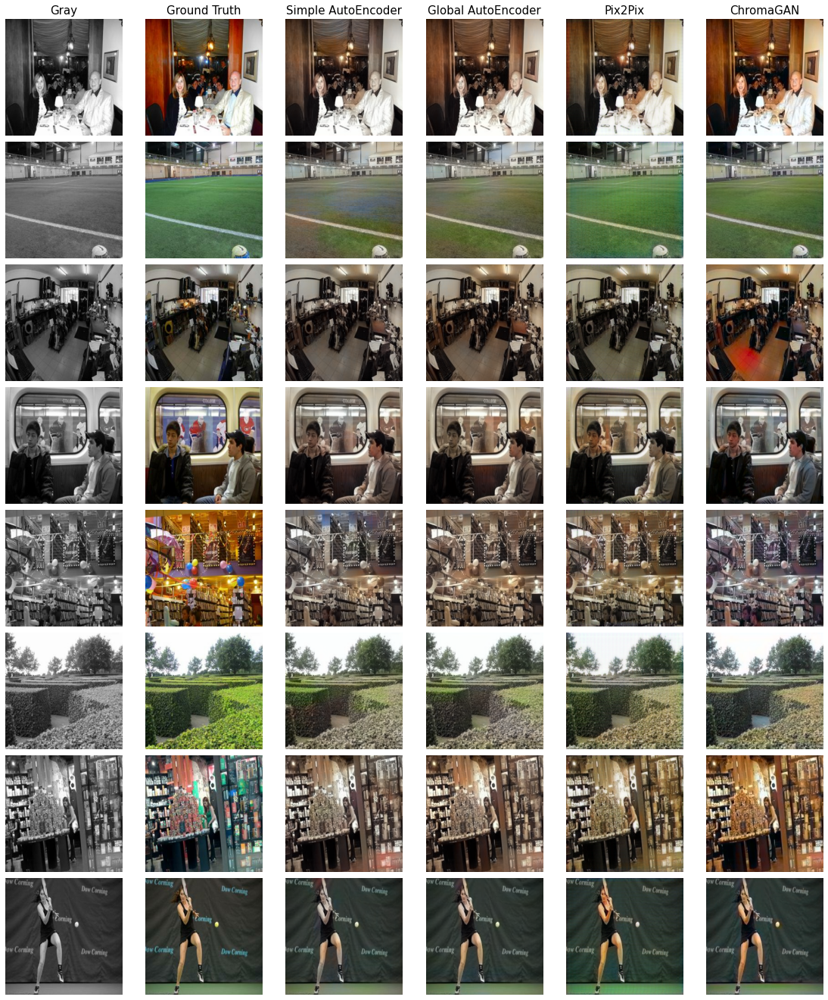

In [10]:
test_dataset = test_dataset.shuffle(BUFFER_SIZE)
colouriseTest()

#Training Results




#Simple AutoEncoder training results


Max validation acc: 0.6826590895652771
Min validation acc: 0.6536784768104553
Max validation loss: 0.011144104413688183
Min validation loss: 0.009539064951241016



optimal epoch  50
Optimal accuracy  0.678590714931488
Optimal loss  0.009539064951241016


<Figure size 432x288 with 0 Axes>

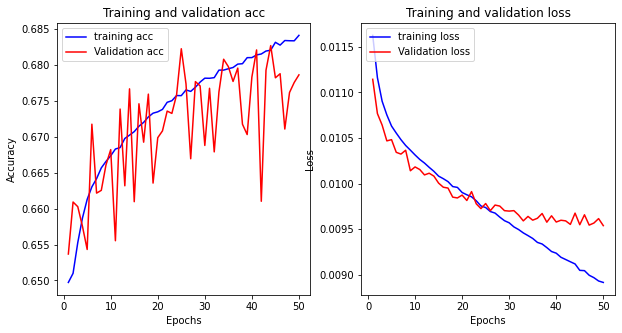

In [ ]:
history = np.load("training_histories/autoencoder_history.npy",allow_pickle=True)
history = dict(enumerate(history.flatten(), 1))[1]
plot_history_results(history)

In Figure 4.1, you can see the training progress of the Simple Autoencoder. The model was trained
for 50 epochs, which took 24 hours to complete. The left graph demonstrates the accuracy for both
validation and training sets, while the right graph displays the loss values for both sets. Notice
how the validation accuracy has a decent ascending trend, although there is some fluctuation. This
is likely due to having a small batch size of 32. The best validation accuracy was 67%, achieved
at epoch 50. Whereas the validation loss decreases between 0 and 20 epochs, then levels off and
eventually reaches a good validation loss of 0.0095 at epoch 50.


#Global AutoEncoder training results


Max validation acc: 0.6904730796813965
Min validation acc: 0.6624308824539185
Max validation loss: 0.010347304865717888
Min validation loss: 0.009172286838293076



optimal epoch  45
Optimal accuracy  0.6904730796813965
Optimal loss  0.009172286838293076


<Figure size 432x288 with 0 Axes>

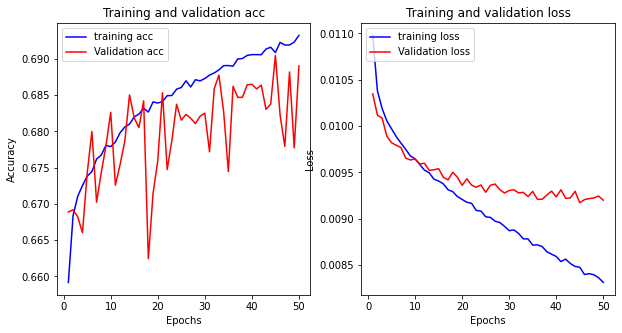

In [ ]:
history = np.load("training_histories/global_autoencoder_history.npy",allow_pickle=True)
history = dict(enumerate(history.flatten(), 1))[1]
plot_history_results(history)

Here, in the above figure, you can see the recorded history of the Global AutoEncoder training progress.
The model has been trained for 50 epochs. However, this method took more time to complete
training (2 days) due to it having more parameters to tune. The left graph depicts an upward trend
in validation accuracy, though fluctuations continue to be an issue. Whereas in the right graph you
can see a similar pattern to the last AutoEncoder, but it drops more quickly and levels out at an
early epoch of 10. The best validation accuracy was 69% and loss was 0.0091, which was achieved
in epoch 45.

#Pix2Pix training results

GAN accuracy  16.880563735961914
DISC accuracy  0.00011124946468044072


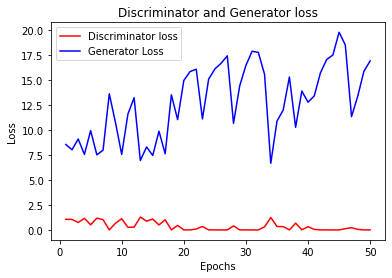

In [ ]:
history = np.load("training_histories/pix2pix_history.npy",allow_pickle=True)
history = dict(enumerate(history.flatten(), 1))[1]
disc_hist = history["d_loss"]
gen_hist = history["g_loss"]
plot_gan_history(disc_hist,gen_hist)

Above figure shows the recorded history of the Pix2Pix cGAN training is shown. The cGAN was trained
for 50 epochs, which took 4 days to train using Slurm facility. As observed from the graph, gen-
erator and discriminator loss have been plotted. It appears as though the generator is failing to
achieve its objective against the discriminator. Despite the generator’s loss having an increasing
trend, at some points, it has achieved a lower loss, for example in epoch 34. If the model were to
be trained for more epochs, the generator would eventually start to win against the discriminator.
However, this would take more time for training. Fortunately, I have also trained this model on a
smaller dataset (7,000 images) over 400 epochs (refer to Appendix B).


# ChromaGAN training results

GAN accuracy  0.00026841916
DISC accuracy  -0.0013185751


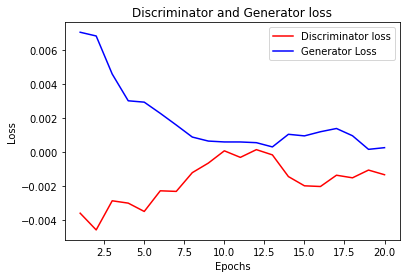

In [ ]:
history = np.load("training_histories/chromagan_history.npy",allow_pickle=True)
disc_hist = history[1]
gen_hist = history[0]
plot_gan_history(disc_hist,gen_hist)

Above shows the training history for ChromaGAN cGAN. Unlike previous methods, Chroma-
GAN was only trained for 20 epochs, due to the long training time of 5 days. The generator loss
shows a descending trend between the first 8 epochs, then begins to plateau until it ascends slightly
between epochs 15 and 17, and then begins to dip again. The discriminator loss mirrors the gener-
ator loss. Compared with Pix2Pix, ChromaGAN shows good progress and does not inherit any of
the issues seen in the Pix2Pix training history graph, such as the increasing, fluctuating generator
loss.


#PSNR & SSIM score

In [ ]:
def PSNR(original, pred,range=255.0):
    psnr = tf.image.psnr(original, pred, max_val=range)
    return psnr

def SSIM(original, pred,range=255.0):
    from skimage.metrics import structural_similarity as ssim
    ssim_score = ssim(original, pred, data_range=range,multichannel=True)
    return ssim_score




test_batch = 21065//BATCH_SIZE
avg_psnr1,avg_ssim1 =0,0
avg_psnr2,avg_ssim2 =0,0
avg_psnr3,avg_ssim3 = 0,0
avg_psnr4,avg_ssim4 = 0,0
for input, target in tqdm(test_dataset): 

  L = rgb2lab(input)[:,:,:,0]/100
  L = L.reshape(L.shape+(1,))
  L2 = read_img(input)/100


  pred1 = model1(L)
  pred2 = model2(L)
  pred3, _  = model4(np.tile(L2,[1,1,1,3]))
  pred3 = tf.image.resize(pred3, [256, 256],
                      method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  result1 = lab2rgb(tf.concat([L*100,pred1*128],axis=-1))
  result2 = lab2rgb(tf.concat([L*100,pred2*128],axis=-1))
  result3 = model3(input)
  result4 =   lab2rgb(rgb2lab(reconstruct(deprocess(L), deprocess(pred3))))
  for i in range(len(pred1)):
    # calculate PSNR & SSIM for model 1
    avg_psnr1+=PSNR(target[i],result1[i], range=1.0)
    avg_ssim1+=SSIM(target[i],result1[i], range=1.0)
    #calculate PSNR & SSIM for model 2
    avg_psnr2+=PSNR(target[i],result2[i], range=1.0)
    avg_ssim2+=SSIM(target[i],result2[i], range=1.0)
    #calculate PSNR & SSIM for model 3
    avg_psnr3+=PSNR(target[i], result3[i], range=1.0)
    avg_ssim3+=SSIM(target[i], result3[i], range=1.0)
    #calculate PSNR & SSIM for model 4
    avg_psnr4+=PSNR(target[i], result4[i], range=1.0)

    avg_ssim4+=SSIM(target[i], result4[i], range=1.0)

  

In [39]:
print("model 1 PSNR: ",avg_psnr1.numpy()/(test_batch*BATCH_SIZE))
print("model 2 PSNR: ",avg_psnr2.numpy()/(test_batch*BATCH_SIZE))
print("model 3 PSNR: ",avg_psnr3.numpy()/(test_batch*BATCH_SIZE))
print("model 4 PSNR: ",avg_psnr4.numpy()/(test_batch*BATCH_SIZE))
print("=======================================================")
print("model 1 SSIM: ",avg_ssim1/(test_batch*BATCH_SIZE))
print("model 2 SSIM: ",avg_ssim2/(test_batch*BATCH_SIZE))
print("model 3 SSIM: ",avg_ssim3/(test_batch*BATCH_SIZE))
print("model 4 SSIM: ",avg_ssim4/(test_batch*BATCH_SIZE))

model 1 PSNR:  24.35508005364603
model 2 PSNR:  24.446530514147362
model 3 PSNR:  23.34644713729586
model 4 PSNR:  23.940008723414355
model 1 SSIM:  0.9333851701891058
model 2 SSIM:  0.9361028326861568
model 3 SSIM:  0.9063164870382343
model 4 SSIM:  0.9208865576867237


The PSNR and SSIM objective metrics were used to evaluate all mentioned architectures using
a test set of 21,000 images. Here, you can see a correlation between both metrics. For example,
the Global AutoEncoder achieves the best PSNR and SSIM score of 24.45 and 0.936 respectively.
Whereas, Pix2Pix comes in last, scoring the lowest in PSNR and SSIM score. Notice how the Au-
toEncoder class outperforms the cGAN, this may be due to the nature of the AutoEncoder training,
which involves iteratively attempts to make the predictions similar and more inclined to the tar-
gets, and both, PSNR and SSIM relies on similarity. Whereas the cGAN were trained to make the
resulting predictions realistic, which disregards the aim of making it similar, hence why the cGAN
performed worse off.

# Naturalness Perception score

## Load study results

In [11]:
!unzip user_study_results.zip

Archive:  user_study_results.zip
   creating: results/
  inflating: results/794296_220417_173958.csv  
  inflating: results/794296_220419_003520.csv  
  inflating: results/794296_220418_005623.csv  
  inflating: results/794296_220418_221122.csv  
  inflating: results/794296_220419_001451.csv  
  inflating: results/794296_220418_224326.csv  
  inflating: results/794296_220419_003244.csv  
  inflating: results/794296_220417_174241.csv  
  inflating: results/794296_220418_153418.csv  
  inflating: results/794296_220418_190538.csv  
  inflating: results/794296_220418_221625.csv  
  inflating: results/794296_220419_003954.csv  
  inflating: results/794296_220418_190450.csv  
  inflating: results/794296_220419_003727.csv  
  inflating: results/794296_220418_195110.csv  
  inflating: results/794296_220418_190636.csv  
  inflating: results/794296_220417_175957.csv  
  inflating: results/794296_220418_125155.csv  
  inflating: results/794296_220419_002748.csv  
  inflating: results/794296_22041

## Study results helper functions

In [12]:
def natural_accuracy():
  true_total_per_class = {'model1_r_acc':[],
                          'model2_r_acc':[],
                          'model3_r_acc':[],
                          'model4_r_acc':[],
                          'real_r_acc':[]}
  # pd.read_csv()
  import glob
  CSVs = (glob.glob("./results/*"))
  N = len(CSVs)
  for result in CSVs:
    result = pd.read_csv(result, skiprows=2)
    model1_score = result.loc[result["method"]=="Method1"].groupby('response').count()["rowNo"]["r"] / 25
    model2_score = result.loc[result["method"]=="Method2"].groupby('response').count()["rowNo"]["r"] / 25
    model3_score = result.loc[result["method"]=="Method3"].groupby('response').count()["rowNo"]["r"] / 25
    model4_score = result.loc[result["method"]=="Method4"].groupby('response').count()["rowNo"]["r"] / 25
    target_score = result.loc[result["method"]=="Target"].groupby('response').count()["rowNo"]["r"] / 25

    true_total_per_class['model1_r_acc'].append(model1_score)
    true_total_per_class['model2_r_acc'].append(model2_score)
    true_total_per_class['model3_r_acc'].append(model3_score)
    true_total_per_class['model4_r_acc'].append(model4_score)
    true_total_per_class['real_r_acc'].append(target_score)


  true_total_per_class['model1_r_acc']=np.average(np.array(true_total_per_class['model1_r_acc']))
  true_total_per_class['model2_r_acc']=np.average(np.array(true_total_per_class['model2_r_acc']))
  true_total_per_class['model3_r_acc']=np.average(np.array(true_total_per_class['model3_r_acc']))
  true_total_per_class['model4_r_acc']=np.average(np.array(true_total_per_class['model4_r_acc']))
  true_total_per_class['real_r_acc']=np.average(np.array(true_total_per_class['real_r_acc']))

    
    
    

  return true_total_per_class  

def get_image_scores():
  true_total_per_class = {'model1_r_acc':np.zeros((1,25)),
                          'model2_r_acc':np.zeros((1,25)),
                          'model3_r_acc':np.zeros((1,25)),
                          'model4_r_acc':np.zeros((1,25)),
                          'real_r_acc':np.zeros((1,25))}
  # pd.read_csv()
  import glob
  CSVs = (glob.glob("./results/*"))
  N = len(CSVs)
  for result in CSVs:
    result = pd.read_csv(result, skiprows=2)
    model1_score = result.loc[result["method"]=="Method1"]["response"]
    model1_score=model1_score.replace("r",1)
    model1_score=model1_score.replace("f",0)
    model1_score=np.array(model1_score)
    
    model2_score = result.loc[result["method"]=="Method2"]["response"]
    model2_score=model2_score.replace("r",1)
    model2_score=model2_score.replace("f",0)
    model2_score=np.array(model2_score)

    model3_score = result.loc[result["method"]=="Method3"]["response"]
    model3_score=model3_score.replace("r",1)
    model3_score=model3_score.replace("f",0)
    model3_score=np.array(model3_score)

    model4_score = result.loc[result["method"]=="Method4"]["response"]
    model4_score=model4_score.replace("r",1)
    model4_score=model4_score.replace("f",0)
    model4_score=np.array(model4_score)

    target_score = result.loc[result["method"]=="Target"]["response"]
    target_score=target_score.replace("r",1)
    target_score=target_score.replace("f",0)
    target_score=np.array(target_score)



    true_total_per_class['model1_r_acc']=true_total_per_class['model1_r_acc']+model1_score
    true_total_per_class['model2_r_acc']=true_total_per_class['model2_r_acc']+model2_score
    true_total_per_class['model3_r_acc']=true_total_per_class['model3_r_acc']+model3_score
    true_total_per_class['model4_r_acc']=true_total_per_class['model4_r_acc']+model4_score
    true_total_per_class['real_r_acc']=true_total_per_class['real_r_acc']+target_score

  true_total_per_class['model1_r_acc']=true_total_per_class['model1_r_acc']/27
  true_total_per_class['model2_r_acc']=true_total_per_class['model2_r_acc']/27
  true_total_per_class['model3_r_acc']=true_total_per_class['model3_r_acc']/27
  true_total_per_class['model4_r_acc']=true_total_per_class['model4_r_acc']/27
  true_total_per_class['real_r_acc']=true_total_per_class['real_r_acc']/27   
    
    

  return true_total_per_class  





## Load images used within the study

In [6]:
!unzip colourised_images

Archive:  drive/MyDrive/colourised_images.zip
   creating: .ipynb_checkpoints/
   creating: model1/
   creating: model2/
   creating: model3/
   creating: model4/
   creating: real/
  inflating: model3/result3_30.jpeg  
  inflating: model3/result3_15.jpeg  
  inflating: model3/result3_35.jpeg  
  inflating: model3/result3_2.jpeg   
  inflating: model3/result3_36.jpeg  
  inflating: model3/result3_3.jpeg   
  inflating: model3/result3_1.jpeg   
  inflating: model3/result3_21.jpeg  
  inflating: model3/result3_22.jpeg  
  inflating: model3/result3_34.jpeg  
  inflating: model3/result3_19.jpeg  
  inflating: model3/result3_39.jpeg  
  inflating: model3/result3_10.jpeg  
  inflating: model3/result3_17.jpeg  
  inflating: model3/result3_7.jpeg   
  inflating: model3/result3_5.jpeg   
  inflating: model3/result3_24.jpeg  
  inflating: model3/result3_33.jpeg  
  inflating: model3/result3_37.jpeg  
  inflating: model3/result3_12.jpeg  
  inflating: model3/result3_32.jpeg  
  inflating: model3/

## Visualise results

26 participants took part in the naturalness study. The study included real images to provide
baseline accuracy. The best performing model was ChromaGAN, which achieved 74% accuracy.
Pix2Pix followed with 53% accuracy. Global AutoEncoder came in third with 51%. Simple Au-
toEncoder had the lowest score of 45%. None of the methods, however, were able to come close
to the real image score of 93%. This may be due to errors that easily gave away the naturalness
of the image. For example, visual abstracts which were seen in the first three methods, also, pho-
tos containing humans were turned into zombies as parts of their body remained grey. This was
seen throughout the first three models. ChromaGAN managed to perform reasonably well, but the
reason it isn’t on the same level as real images is likely due to the bland colour palette, which is
seen throughout all methods. In contrast to the objective scores, cGAN outperformed the AutoEn-
coders in this study. This was discussed earlier that the cGAN mainly aims to perform realistic
colourisation, which is what this study relies on.


In [18]:
results = natural_accuracy()

data = {'Models': ["Simple AutoEncoder","Global AutoEncoder","Pix2Pix","ChromaGAN","Real images"],
          'Acc (%)': list(results.values()),
          }
df = pd.DataFrame(data)
df.style.hide_index()

Models,Acc (%)
Simple AutoEncoder,0.448696
Global AutoEncoder,0.523478
Pix2Pix,0.537391
ChromaGAN,0.737391
Real images,0.920000


## Display all images along side their scores + PSNR & SSIM

Here , i've displayed the colourised results. The left-most column represents the ground truth where the following right
columns represent the four methods I have discussed so far. Here, the naturalness percentage
score alongside their respective PSNR SSIM scores.
You can notice how the cGAN models (pix2pix & chromaGAN) have performed on average the
best in terms of naturalness scores, whereas the two AutoEncoders have scored better in terms
of PSNR SSIM. As discussed in the last section, there does seem to be a clear trade-off between
4.3. Evaluation 37
the objective metrics and Naturalness scores. It’s fair to assume that the cGAN is likely to be the
preferred method even if it has a worse average PSNR SSIM score. In my opinion the scores
observed from the human eye (naturalness study) matter more than the scores computed by the
computer (PSNR SSIM). Out of all methods, it’s observed that the ChromaGAN is the best-suited
model for image colourisation.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


[23.797693 23.66342  23.303461 22.47903 ]


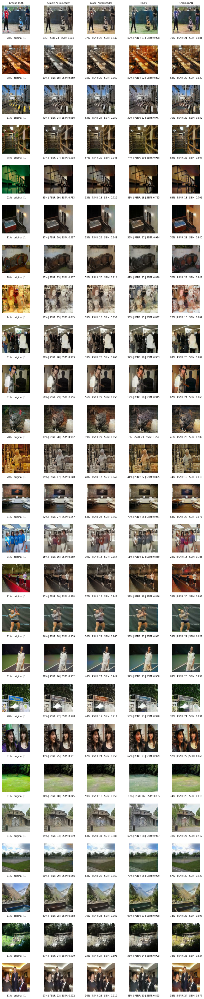

In [53]:
scores = get_image_scores()

model1_scores = scores["model1_r_acc"][0]
model2_scores = scores["model2_r_acc"][0]
model3_scores = scores["model3_r_acc"][0]
model4_scores = scores["model4_r_acc"][0]
real_scores = scores["real_r_acc"][0]
imgs = [0,1,2,3,4,5,6,7,8,9,10,12,13,15,16,18,23,24,29,27,30,36,37,35,38]
scores_arr = [real_scores,model1_scores,model2_scores,model3_scores,model4_scores]
avg_pnsr=[0,0,0,0]

f, axarr = plt.subplots(len(imgs),5,
                       gridspec_kw={'wspace':0.5,'hspace':0.2,
                                    'top':2.5, 'bottom':0, 'left':0., 'right':0.5},figsize=(20,20))  

font_size=8

#Set titles
axarr[0,0].set_title("Ground Truth").set_fontsize(font_size)
axarr[0,1].set_title("Simple AutoEncoder").set_fontsize(font_size)
axarr[0,2].set_title("Global AutoEncoder").set_fontsize(font_size)
axarr[0,3].set_title("Pix2Pix").set_fontsize(font_size)
axarr[0,4].set_title("ChromaGAN").set_fontsize(font_size)


for i,scores in enumerate(scores_arr):
  plt.tight_layout()
  scores = scores_arr[i]
  for j in range(len(imgs)):
    score = float("{:.2f}".format(scores[j]))*100
    score = int(round(score))
    url = (f"model{i}/result{i}_{imgs[j]}.jpeg")
    real_url = (f"real/target_{imgs[j]}.jpeg")

    
    


    if i>0:
      image = tf.io.read_file(url)
      image = tf.io.decode_jpeg(image,channels=3)
      image = np.array(image)
      image = image.astype("float32")/256

      real = tf.io.read_file(real_url)
      real = tf.io.decode_jpeg(real,channels=3)
      real = np.array(real)
      real = real.astype("float32")/256
      psnr = PSNR(real,image, range=1.0)
      ssim = SSIM(real,image, range=1.0)
      ssim = "{:.3f}".format(ssim)

      # axarr[j,i].set_title(f"{score}% | PSNR: {round(float(psnr))}",y=-0.15,pad=-3).set_fontsize(25)
      axarr[j,i].text(x=256/2,y=300,s=f"{score}% | PSNR: {round(float(psnr))} | SSIM: {ssim}",horizontalalignment='center').set_fontsize(font_size)
      axarr[j,i].axis('off')
      axarr[j,i].imshow(image)
      avg_pnsr[i-1]+=psnr


    else:
      image = tf.io.read_file(real_url)
      image = tf.io.decode_jpeg(image,channels=3)
      image = np.array(image)
      image = image.astype("float32")/256

      # axarr[j,i].set_title(f"{score}%",y=-0.15,pad=-3).set_fontsize(25)
      axarr[j,i].text(x=256/2,y=300,s=f"{score}% | original | 1",horizontalalignment='center').set_fontsize(font_size)
      axarr[j,i].axis('off')
      axarr[j,i].imshow(image)

avg_pnsr=np.array(avg_pnsr)
avg_pnsr/=len(imgs)
print(avg_pnsr)


#Colourisation analysis

Helper functions

In [19]:
def colouriseMethod1and2(image,model):
    input = np.array([image])
    _,HEIGHT,WIDTH,_=input.shape
    L_original = rgb2lab(input)[:,:,:,0]/100
    L_original = L_original.reshape(L_original.shape+(1,))
    input = tf.image.resize(input, [256, 256],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    #Lab mapping for model 1 & 2
    L = rgb2lab(input)[:,:,:,0]/100
    L = L.reshape(L.shape+(1,))

    pred = model(L)
    pred = tf.image.resize(pred, [HEIGHT, WIDTH],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    result = lab2rgb(tf.concat([L_original*100,pred*128],axis=-1))[0]

    return result

def colouriseMethod3(image):
    input = np.array([image])
    _,HEIGHT,WIDTH,_=input.shape
    L_original = rgb2lab(input)[:,:,:,0]/100
    L_original = L_original.reshape(L_original.shape+(1,))
    input = tf.image.resize(input, [256, 256],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    pred = model3(input)
    pred = rgb2lab(pred)[:,:,:,1:]
    pred = tf.image.resize(pred, [HEIGHT, WIDTH],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    result = lab2rgb(tf.concat([L_original*100,pred],axis=-1))[0]
    return result

def colouriseMethod4(image):
    input = np.array([image])
    _,HEIGHT,WIDTH,_=input.shape
    L_original = rgb2lab(input)[:,:,:,0]/100
    L_original = L_original.reshape(L_original.shape+(1,))
    input = tf.image.resize(input, [256, 256],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    L2 = read_img(input)/100
    pred, _  = model4(np.tile(L2,[1,1,1,3]))
    pred = tf.image.resize(pred, [HEIGHT, WIDTH],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    result = reconstruct(deprocess(L_original), deprocess(pred))

    return result

def colouriseImage(imageFile,vertical=True,showGray=True):
    image = tf.io.read_file(imageFile)
    image = tf.io.decode_jpeg(image,channels=3)
    image = np.array(image)
    image = image.astype("float32")/256


    result1 = colouriseMethod1and2(image,model1)
    result2 = colouriseMethod1and2(image,model2)
    result3 = colouriseMethod3(image)
    result4 = colouriseMethod4(image)[0]
    if showGray:
      if vertical:
        f, axarr = plt.subplots(6,1,figsize=(20,20))  
      else:
        f, axarr = plt.subplots(1,6,figsize=(20,20)) 
      axarr[0].axis('off')
      axarr[1].axis('off')
      axarr[2].axis('off')
      axarr[3].axis('off')
      axarr[4].axis('off')
      axarr[5].axis('off')

      axarr[0].title.set_text("Original")
      axarr[1].title.set_text("Grayscale")
      axarr[2].title.set_text("Simple AutoEncoder")
      axarr[3].title.set_text("Global AutoEncoder")
      axarr[4].title.set_text("Pix2Pix")
      axarr[5].title.set_text("ChromaGAN")
      axarr[0].imshow(image)
      axarr[1].imshow(rgb2gray(image),cmap="gray")
      axarr[2].imshow(result1)
      axarr[3].imshow(result2)
      axarr[4].imshow(result3)
      axarr[5].imshow(result4)
    else:
      if vertical:
        f, axarr = plt.subplots(5,1,figsize=(20,20))  
      else:
        f, axarr = plt.subplots(1,5,figsize=(20,20)) 


    axarr[0].axis('off')
    axarr[1].axis('off')
    axarr[2].axis('off')
    axarr[3].axis('off')
    axarr[4].axis('off')

    axarr[0].title.set_text("Original")
    axarr[1].title.set_text("Simple AutoEncoder")
    axarr[2].title.set_text("Global AutoEncoder")
    axarr[3].title.set_text("Pix2Pix")
    axarr[4].title.set_text("ChromaGAN")
    axarr[0].imshow(image)
    axarr[1].imshow(result1)
    axarr[2].imshow(result2)
    axarr[3].imshow(result3)
    axarr[4].imshow(result4)

    

#Historial photos
I’ve tested each model on historical photos. Results below shows the colourisation results. Since there
are no ground truths to identify how accurate each model is, it is down to personal judgement.
ChromaGAN seems to show the best overall colourisation results as it does a better job colourising
people and their surroundings.



##Titanic

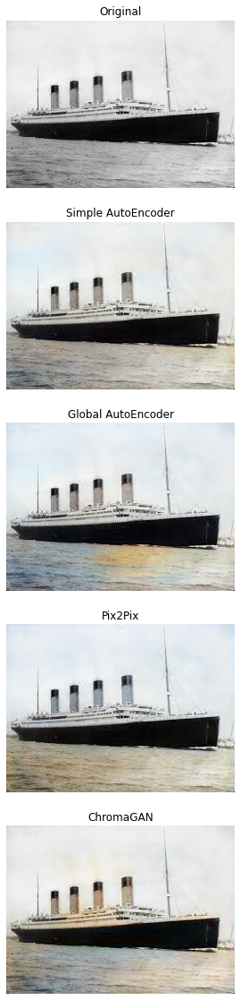

In [ ]:
colourise="images/titanic.jpg"
colouriseImage(colourise,showGray=False)

##WW2

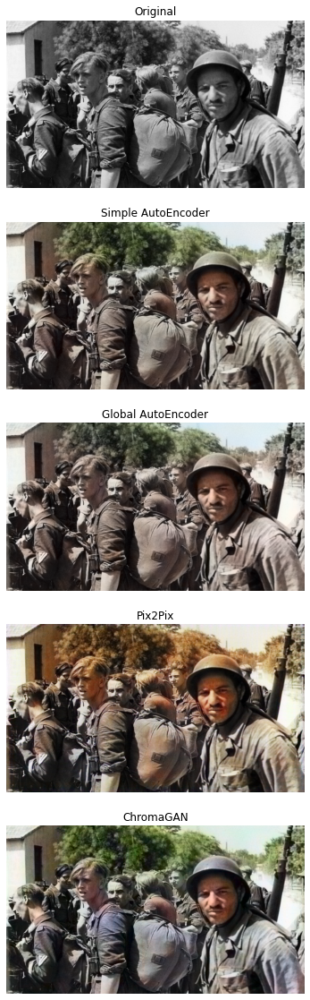

In [ ]:
colourise="images/ww2.jpg"
colouriseImage(colourise,showGray=False)



###Old London

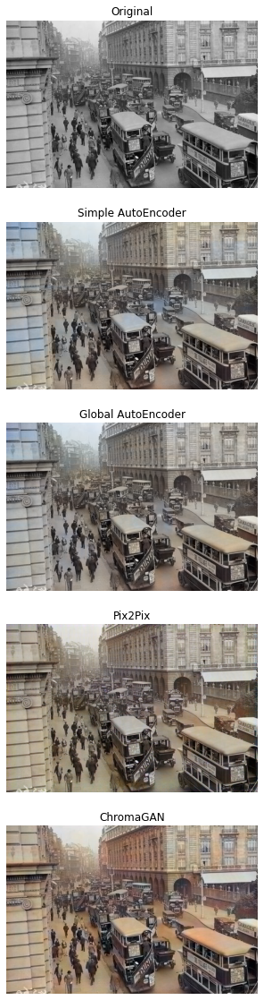

In [21]:
colourise="images/old_london.jpg"
colouriseImage(colourise,showGray=False)

###Martin Luther King

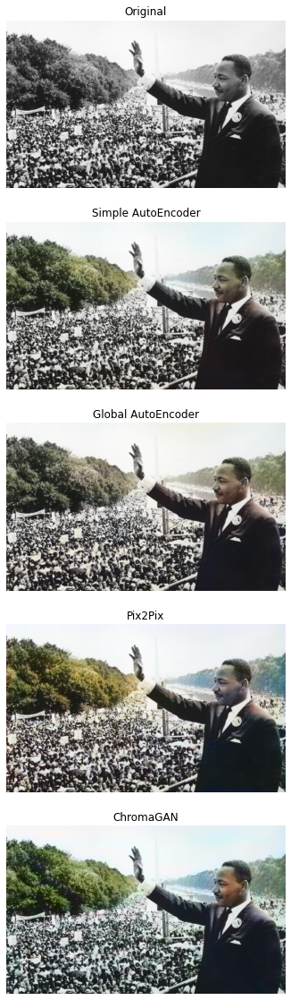

In [22]:
colourise="images/martin_luther_king.jpg"
colouriseImage(colourise,showGray=False)

##WW2 combat scene

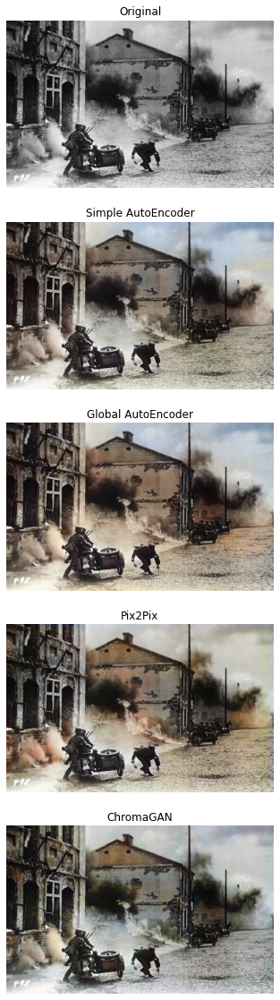

In [ ]:
colourise="images/ww2_combat.jfif"
colouriseImage(colourise,showGray=False)

##Queen Elizabeth as a mechanic during ww2

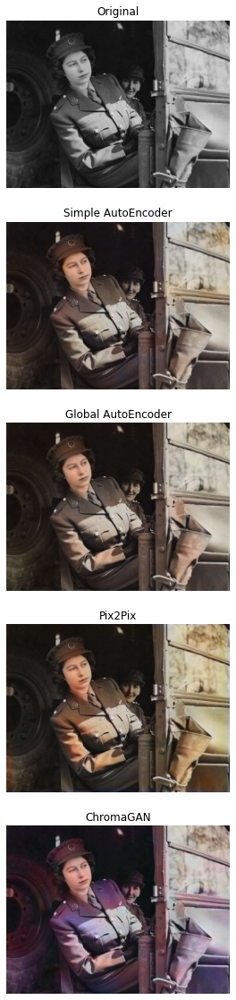

In [ ]:
colourise="images/queen_elizabeth.jpg"
colouriseImage(colourise,showGray=False)

#Landscape and scenery

I also colourised some landscape images. All model seem to do a decent job. The GAN models seem to do better at applying higher variety of colours. ChromaGAN even makes the reflection of the water blue to match the sky.

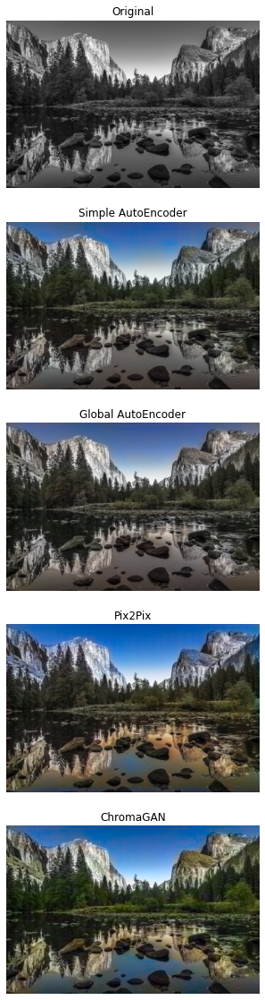

In [ ]:
colourise="images/landscape_1.jfif"
colouriseImage(colourise,showGray=False)

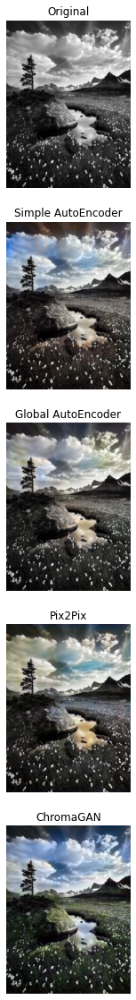

In [ ]:
colourise="images/landscape.jfif"
colouriseImage(colourise,showGray=False)

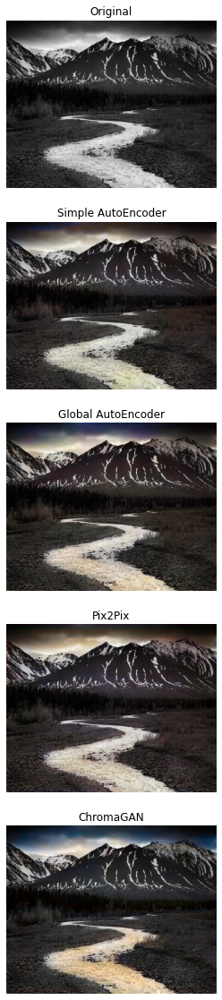

In [ ]:
colourise="images/landscape_3.jfif"
colouriseImage(colourise,showGray=False)

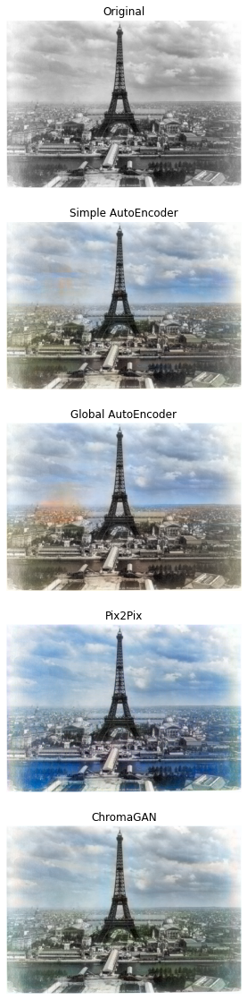

In [ ]:
colourise="images/paris.jpg"
colouriseImage(colourise,showGray=False)

# Image restoration

I’ve handpicked three photos that have suffered deterioration in quality due to environmental
factors such as poor handling, poor material or ageing. The photos were used to test each model’s
capabilities for the purpose of restoring colours.
Out of all methods, the ChromaGAN model has done a decent job in bringing back the vibrant
colours which lacked in the original photos. It even removed the orange hue seen within the first
two original images.
However, not all methods are accurate, for example in the third row, Pix2Pix coloured the curtains
blue instead of yellow.
It is also important to note that the models cannot remove the fade effect or any other visual ab-
stracts seen in the original image as none of the models were trained to deal with this type of issue,
hence why its presence still exists in the resulting images.


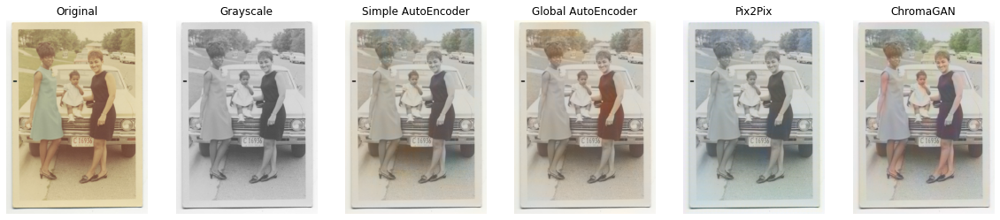

In [ ]:
colourise="images/faded_coloured_photo1.jpg"
colouriseImage(colourise,vertical=False)

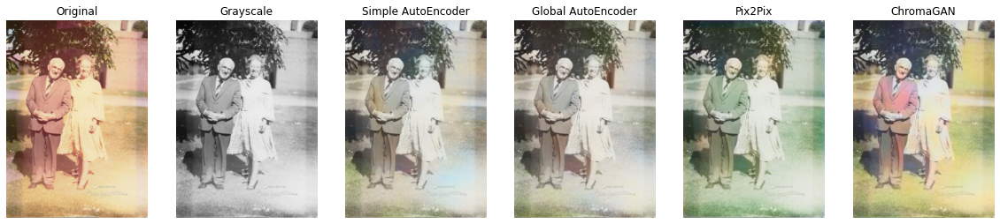

In [ ]:
colourise="images/faded_coloured_photo2.jpg"
colouriseImage(colourise,vertical=False)

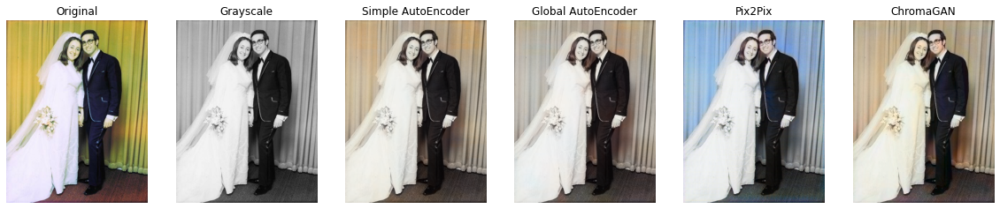

In [ ]:
colourise="images/faded_coloured_photo3.jpg"
colouriseImage(colourise,vertical=False)

# Limitations

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 517 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


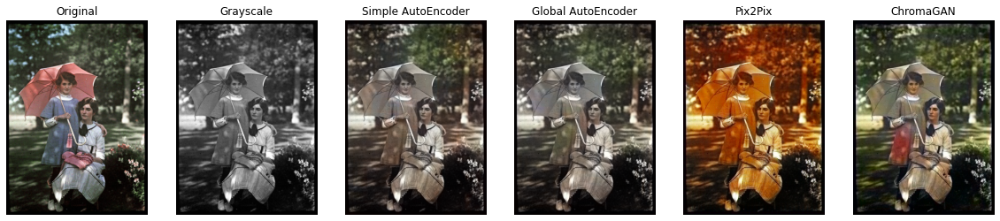

In [ ]:
colourise="images/colour_test.jpg"
colouriseImage(colourise, "",vertical=False)

Here, it is important to outline a few key limitations observed from all methods. For example,
result above demonstrates some form of the limitations suffered by each model:
1. All methods were trained to colourise images of size 256x256 (except ChromaGAN - 242x242),
this means that test images require resizing. Resizing causes distortion which can negatively
impact the colourisation process. This is seen from the first three methods.
2. The colourisation process is biased and will not apply accurate colours to everything. For in-
stance, it failed to colourise the umbrella or the handbag pink. This is because the algorithms
were only trained on what they had seen and likely never trained on images consisting of
pink umbrellas and pink handbags.
3. The predicted colours are also bland, especially complex small objects. This again relates to
the last point of bias: The algorithm has a lot to learn before it can learn to colourise more
entities using accurate colours.
4. Incorrect colour placement and visual abstracts are very apparent and seen throughout all
models. For instance, the colourisation of Pix2Pix is completely all orange, whereas Chroma-
GAN has produced a slight reddish visual abstract which can be seen on the dress of the left
person.
Despite mentioning all these limitations, some of the methods such as ChromaGAN manage to
do a decent enough job to make the colourisation look convincing, however, still suffer from the
limitations mentioned above.



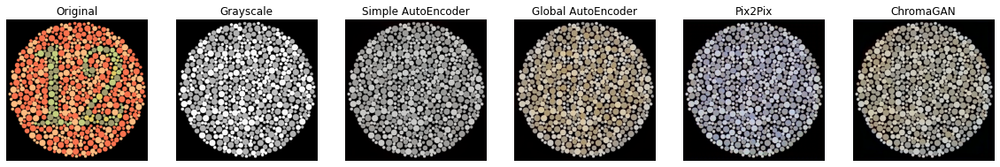

In [ ]:
colourise="images/colourblind_test.png"
colouriseImage(colourise, "",vertical=False)

Furthermore, the methods are not suitable for colourising synthetic images as demonstrated in
figure 4.11. For instance, the colour blind test contains a "12" which is coloured in green. However,
as you can observe, the grayscale image completely loses all the information of all the synthetic
colours, and if we, the viewers can not see a "12" from a grayscale image then neither can the
models.
